# Equipe

Felipe Jun Ting Lin

João Gabriel de Araujo Vasconcelos

Lucas Cavalcanti Calabria

Matheus Machado Guilhermino

Vinícius Revoredo de Albuquerque


# Bibliotecas

## Instalando

In [ ]:
! pip install opencv-contrib-python
! pip install scikit-image
! pip install imutils
! pip install easyocr

## Importando

In [ ]:
import cv2
import imutils
import easyocr
import numpy as np
import matplotlib.pyplot as plt

from os import listdir
from math import sqrt,exp
from google.colab import files
from os.path import isfile, join

## Criação do Leitor

In [ ]:
reader = easyocr.Reader(['en'])

# *Dataset*

## *Upload* das Imagens

In [ ]:
files.upload()

{}

In [ ]:
path = '/content/'
files = [f for f in listdir(path) if isfile(join(path, f))]
print(files)

['33.jpg', '16.jfif', '11.jpg', '21.jfif', '18.jfif', '23.jfif', '6.png', '22.jfif', '37.jfif', '7.jpg', '40.jfif', '39.jfif', '35.jfif', '9.jpeg', '24.jfif', '15.jfif', '10.png', '2.png', '1.png', '25.jfif', '4.png', '26.jfif', '31.jpg', '8.jpg', '34.jfif', '29.jfif', '19.jpg', '3.png', '14.jfif', '36.jfif', '28.jfif', '38.jfif', '30.jfif', '32.jfif', '20.jfif', '13.jfif', '17.jfif', '12.jpg', '27.jfif', '5.png']


## Imagem para Exemplos

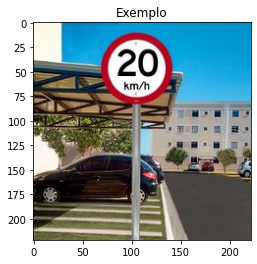

In [ ]:
img = cv2.imread('1.png')
img_cvt=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.title("Exemplo")
plt.imshow(img_cvt)
plt.show()

# Filtro Ideal Passa-Altas

In [ ]:
# Estrutura filtro passa-altas ideal
def idealFilterHP(D0,imgShape):
    base = np.ones(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)

    for x in range(cols):
        for y in range(rows):
            point = (y, x)
            d = sqrt((point[0]-center[0])**2 + (point[1]-center[1])**2)

            if d < D0:
                base[y,x] = 0

    return base

# Estrutura filtro butterworth passa-altas
def butterworthHP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)

    for x in range(cols):
        for y in range(rows):
          point = (y, x)
          d = sqrt((point[0]-center[0])**2 + (point[1]-center[1])**2)

          base[y,x] = 1-1/(1+(d/D0)**(2*n))

    return base

# Cálculo da Estatítica Gaussiana

In [ ]:
# Calculo da est. gaussiana
def gauss(mat):
  l, c = mat.shape
  sum = 0

  # (P = 1, Q = 0)
  for i in range(0, l-1):
    for j in range(0, c):
      sum += (mat[i][j] - mat[i+1][j])**2

  return sum

# Criação de Vetor de Contornos

In [ ]:
def make_vector_crops(img, img_aux, f_print = False):
  # Encontra fronteiras da imagem pela derivada
  img_aux = cv2.Sobel(np.float32(img_aux), ddepth = cv2.CV_32F, dx = 1, dy = 0, ksize = -1)
  img_aux = np.absolute(img_aux)

  (minVal, maxVal) = (np.min(img_aux), np.max(img_aux))

  img_aux = 255 * ((img_aux - minVal) / (maxVal - minVal))
  img_aux = img_aux.astype("uint8")

  # Aplicando Gaussian Blur
  img_aux = cv2.GaussianBlur(img_aux, (5, 5), 0)

  # Printa resultado parcial se necessario
  if f_print:
    plt.title("Gaussian Blur")
    plt.imshow(np.abs(img_aux), "gray")
    plt.show()

  # Criando estruturas para op. morfologicas
  rect_grid_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (13, 5))
  square_grid_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

  # Op. morfologicas
  mask = cv2.morphologyEx(img, cv2.MORPH_CLOSE, square_grid_kernel)
  mask = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

  img_aux = cv2.morphologyEx(img_aux, cv2.MORPH_CLOSE, rect_grid_kernel)
  img_aux = cv2.threshold(img_aux, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

  img_aux = cv2.erode (img_aux, None, iterations=2)
  img_aux = cv2.dilate(img_aux, None, iterations=2)
  img_aux = cv2.bitwise_and(img_aux, img_aux, mask=mask)
  img_aux = cv2.dilate(img_aux, None, iterations=2)
  img_aux = cv2.erode (img_aux, None, iterations=1)

  # Printa resultado parcial se necessario
  if f_print:
    plt.title("Transformacoes Morfologicas")
    plt.imshow(np.abs(img_aux), "gray")
    plt.show()

  # Encontrando possíveis placas
  contours = cv2.findContours(img_aux.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contours = imutils.grab_contours(contours)

  # Filtrando 5 maiores candidatos
  contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

  return contours

# Aplicação dos Filtros

In [ ]:
def applyIdealHP(img, f_print = False):
  # Transformada rápida de Fourier
  img_aux = np.fft.fft2(img)

  # Shift para o centro , filtro ideal passa-alta, desfaz shift
  img_aux = np.fft.fftshift(img_aux)
  img_aux = img_aux * idealFilterHP(50, img.shape)
  img_aux = np.fft.ifftshift(img_aux)

  # Transformada inversa
  img_aux = np.fft.ifft2(img_aux)

  # Printa resultado parcial se necessario
  if f_print:
    plt.title("Filtro Passa-Altas Ideal")
    plt.imshow(np.abs(img_aux), "gray")
    plt.show()

  contours = make_vector_crops(img, img_aux, f_print)

  return contours

def applyButterworthHP(img, f_print = False):
  # Transformada rápida de Fourier
  img_aux = np.fft.fft2(img)

  # Shift para o centro , filtro ideal passa-alta, desfaz shift
  img_aux = np.fft.fftshift(img_aux)
  img_aux = img_aux * butterworthHP(50, img.shape, 3)
  img_aux = np.fft.ifftshift(img_aux)

  # Transformada inversa
  img_aux = np.fft.ifft2(img_aux)

  # Printa resultado parcial se necessario
  if f_print:
    plt.title("Filtro Butterworth Passa-Altas")
    plt.imshow(np.abs(img_aux), "gray")
    plt.show()

  contours = make_vector_crops(img, img_aux, f_print)

  return contours

# Método de Estatística Gaussiana

In [ ]:
def gaussian_met(img, img_og, vector_crops):
    lesser_mean = 10000000
    chosen_one = None

    for square in vector_crops:
      # Filtra pelo aspect ratio
      (x, y, w, h) = cv2.boundingRect(square)
      aspect_ratio_rect = float(w) / float(h)

      if aspect_ratio_rect >= 1 and aspect_ratio_rect <= 5:
        sum = 0
        tot = 0

        # Demarcando possiveis placas
        cv2.rectangle(img_og, (x, y), (x + w, y + h), (255,0,255), 2)

        crop_aux = img[y:y + h, x:x + w]
        crop = cv2.threshold(crop_aux, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
      
        # Criando mat das medias do el. 4x4
        a, b = crop.shape
        row = a // 4
        column = b // 4
        aux_mat = np.zeros((row,column))

        # Media de cada elemento 4x4 da img
        for i in range(0,row):
          for j in range(0,column):
            # Cria mat 4x4
            aux = [crop[i][j*4 : j*4 + 4] for i in range(i*4,i*4 + 4)]
            aux = np.array(aux)

            # Met. est. para encontrar medias da mat 4x4
            aux_mat[i][j] = gauss(aux)

        # Media da imagem sendo testada
        for i in aux_mat:
          for j in i:
            tot += 1
            sum += j
        
        if tot == 0:
          tot = 1
          
        mean =  sum/tot

        # Escolhendo a imagem com menor media
        if (mean < lesser_mean):
          lesser_mean = mean
          chosen_one = crop_aux

    # Plota imagem com as placas analisadas
    plt.title("Possible Signs")
    img_cvt=cv2.cvtColor(img_og, cv2.COLOR_BGR2RGB)
    plt.imshow(img_cvt)
    plt.show()

    return (chosen_one)

# Aplicando Modelo no Exemplo

## Passando para o Espectro da Frequência

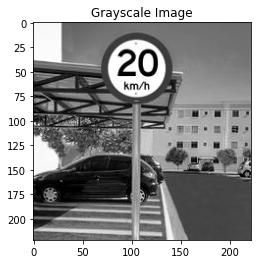

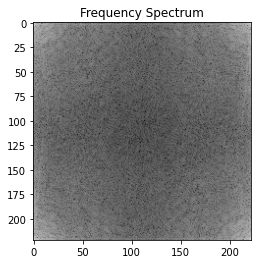

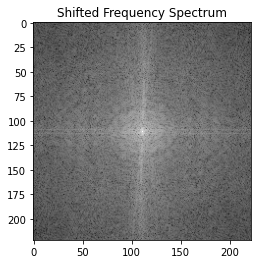

In [ ]:
img = cv2.imread('1.png',0)

# Imagem original grayscale
plt.title("Grayscale Image")
plt.imshow(img, "gray")
plt.show()

# Aplicando a transformada rápida de Fourier
img = np.fft.fft2(img)

plt.title("Frequency Spectrum")
plt.imshow(np.log(np.abs(img)), "gray")
plt.show()

# Move os componentes de baixa frequência para o centro do espectro
img = np.fft.fftshift(img)

plt.title("Shifted Frequency Spectrum")
plt.imshow(np.log(np.abs(img)), "gray")
plt.show()

## Destacando Elementos de Interesse

### Ideal Passa-Altas

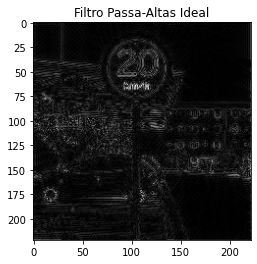

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until


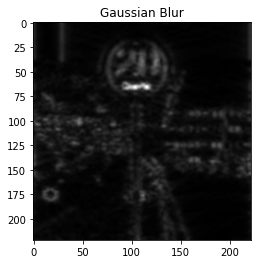

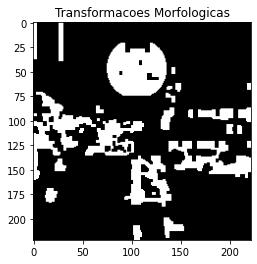

In [ ]:
img = cv2.imread('1.png',0)
vector_crops = applyIdealHP(img, True)

### Butterworth Passa-Altas

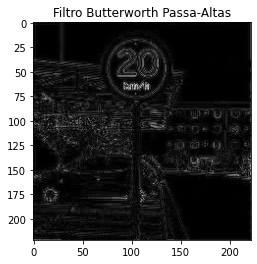

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until


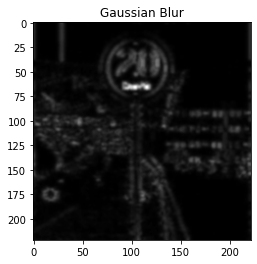

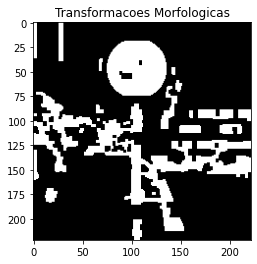

In [ ]:
img = cv2.imread('1.png',0)
vector_crops = applyButterworthHP(img, True)

## Encontrando Melhor Candidato

### Ideal Passa-Altas

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: overflow encountered in ubyte_scalars
  if __name__ == '__main__':


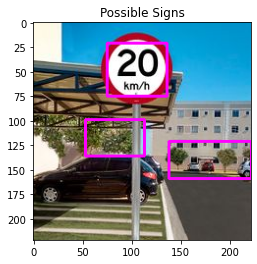

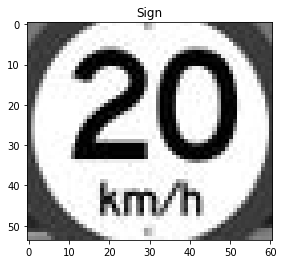

In [ ]:
img = cv2.imread('/content/' + '1.png', 0)
img_orig = cv2.imread('/content/' + '1.png')

vector_crops = applyIdealHP(img)

final_img = gaussian_met(img, img_orig, vector_crops)

plt.title("Sign")
plt.imshow(final_img, "gray")

### Butterworth Passa-Altas

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: overflow encountered in ubyte_scalars
  if __name__ == '__main__':


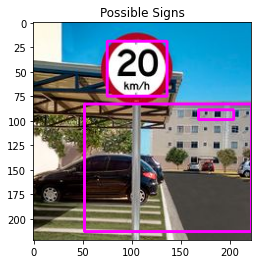

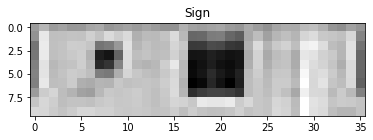

In [ ]:
img = cv2.imread('/content/' + '1.png', 0)
img_orig = cv2.imread('/content/' + '1.png')

vector_crops = applyButterworthHP(img)

final_img = gaussian_met(img, img_orig, vector_crops)

plt.title("Sign")
plt.imshow(final_img, "gray")

## Lendo Caracteres da Placa

In [ ]:
result = reader.readtext(final_img)

sign = ''

for i in result:
  sign += (i[1])
  print(f"Text: {sign}")  

# Aplicando Modelo no *Dataset*

## Filtro Ideal Passa-Altas

33.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: overflow encountered in ubyte_scalars
  if __name__ == '__main__':


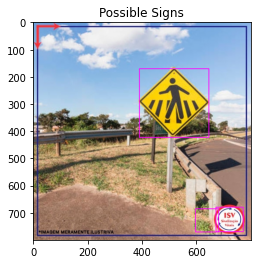

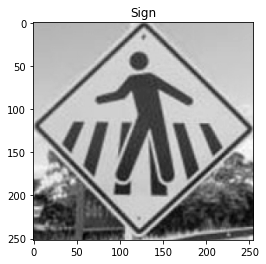

16.jfif


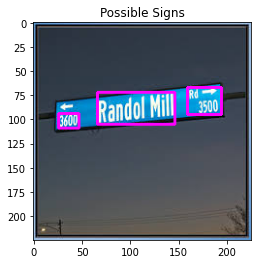

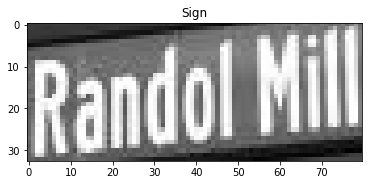

Text: Randol Mill
11.jpg


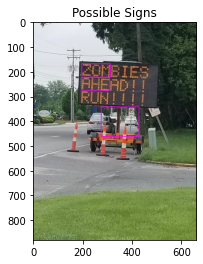

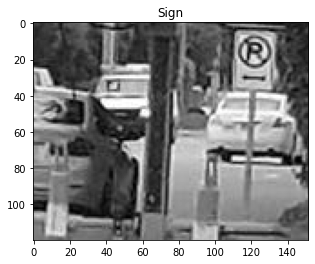

21.jfif


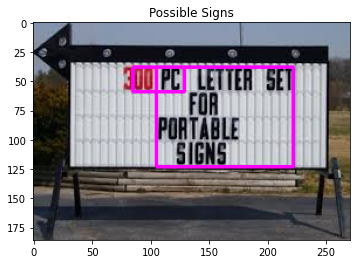

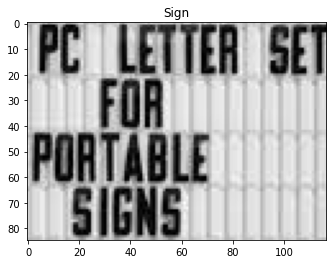

Text: PC |LETTEA  SET
Text: PC |LETTEA  SETFOA
Text: PC |LETTEA  SETFOAPORILELE 
Text: PC |LETTEA  SETFOAPORILELE SIGNS
18.jfif


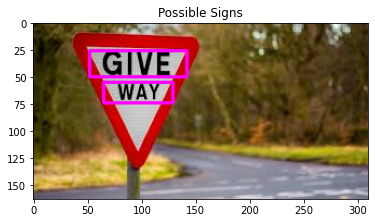

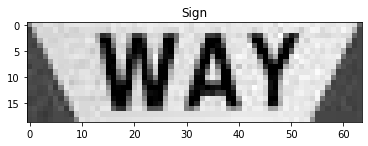

Text: WAY
23.jfif


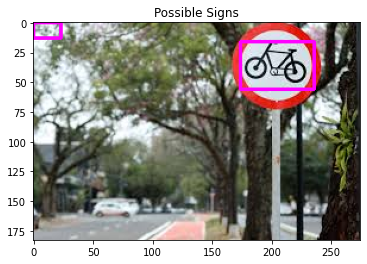

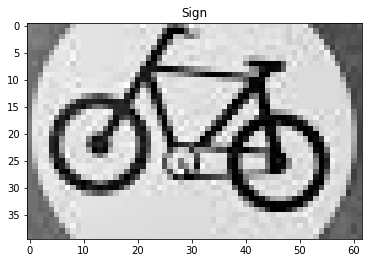

6.png


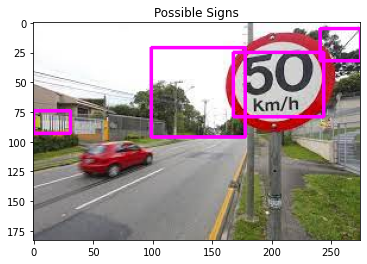

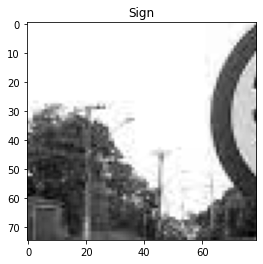

22.jfif


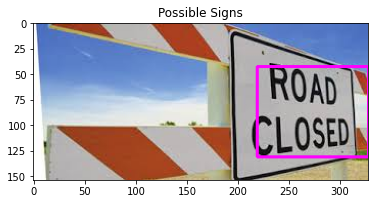

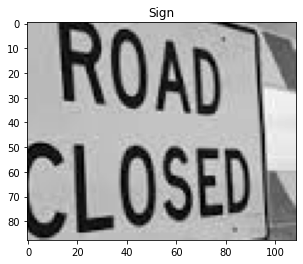

Text: ROad"
Text: ROad"CLOSED]
37.jfif


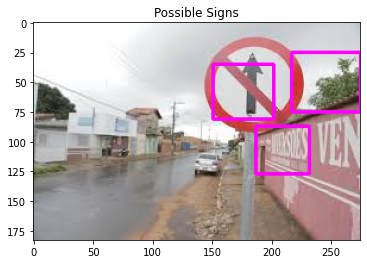

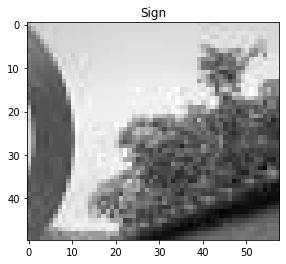

7.jpg


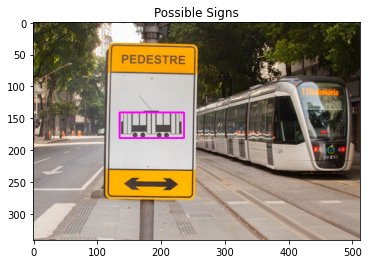

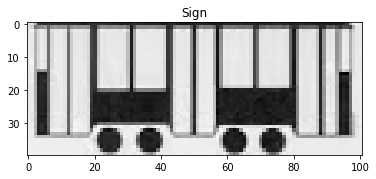

40.jfif


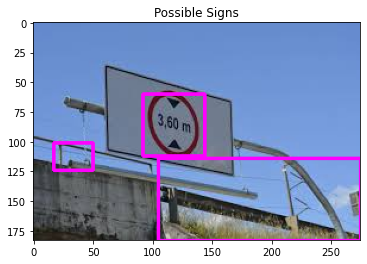

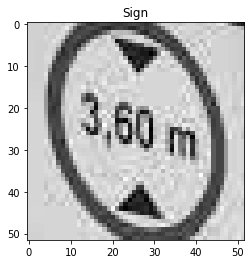

Text: 3,60m
39.jfif


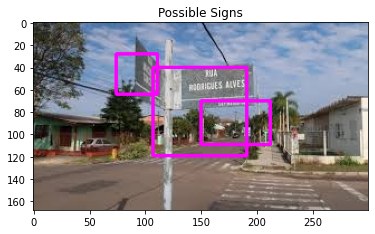

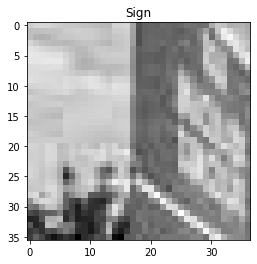

35.jfif


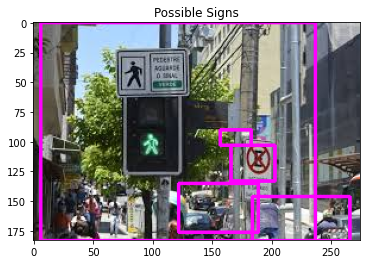

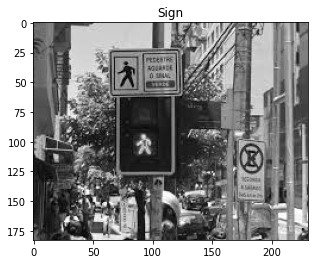

9.jpeg


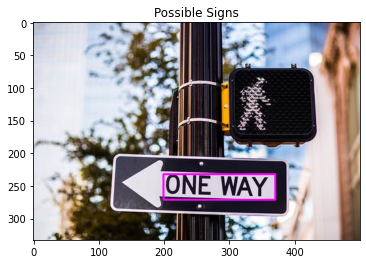

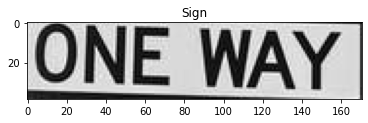

Text: ONE WAY
24.jfif


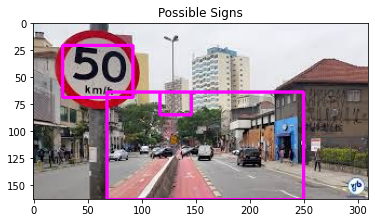

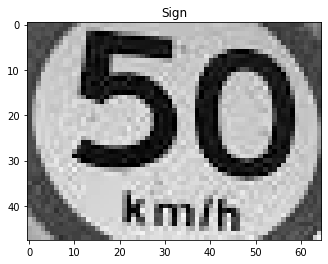

Text: 50
Text: 50kmh
15.jfif


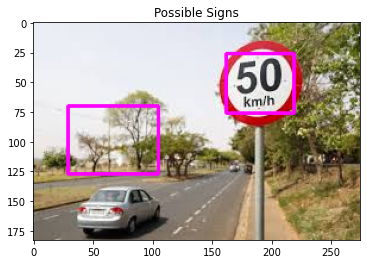

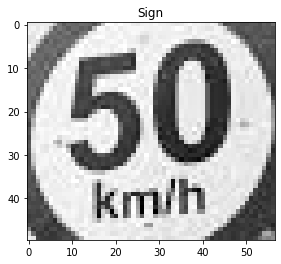

Text: 50
Text: 50kmlh
10.png


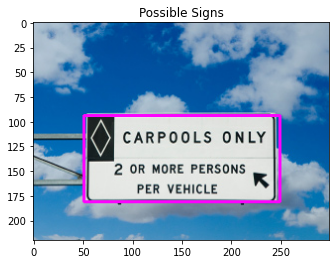

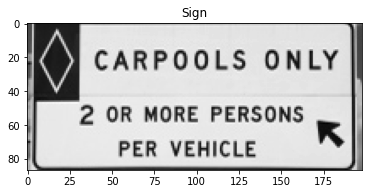

Text: CARPOOLS OnLY
Text: CARPOOLS OnLYOR MORE PERSONS
Text: CARPOOLS OnLYOR MORE PERSONSPER VEHICLE
2.png


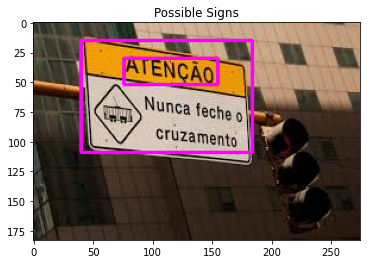

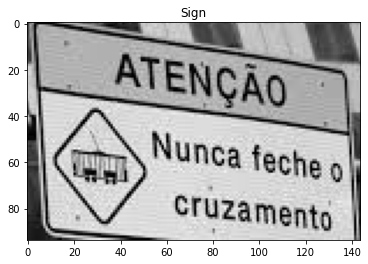

Text: cruzamento
Text: cruzamentoATENCAO
Text: cruzamentoATENCAONunca
Text: cruzamentoATENCAONuncafeche =
1.png


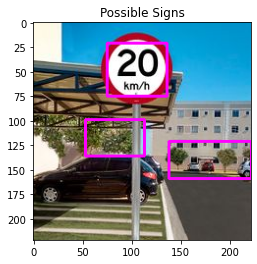

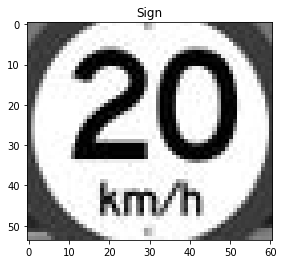

Text: 20
Text: 20km/h
25.jfif


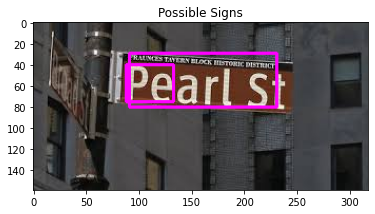

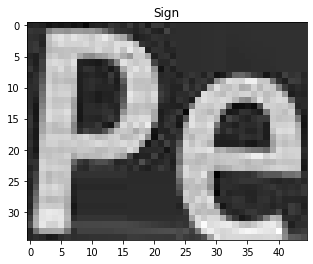

Text: Pe
4.png


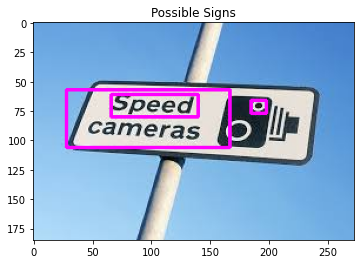

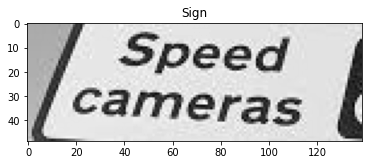

Text: Speed
Text: Speedcameras
26.jfif


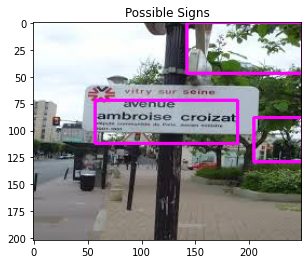

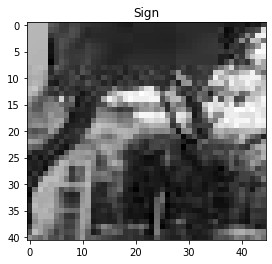

31.jpg


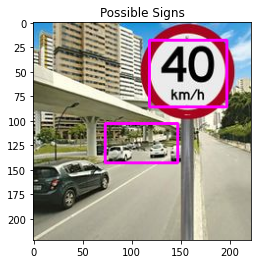

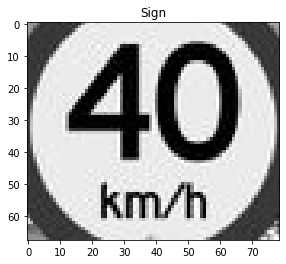

Text: 40
Text: 40km/h
8.jpg


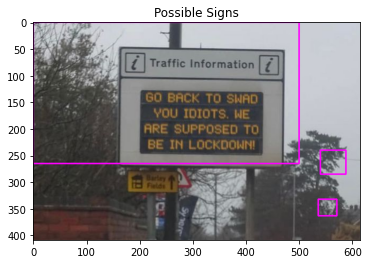

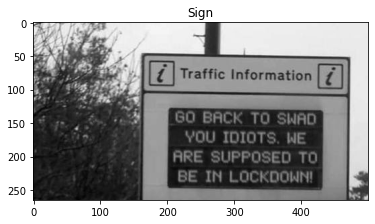

Text: Traffic Information
Text: Traffic InformationG0 BaCKTo Shad
Text: Traffic InformationG0 BaCKTo ShadYOU IDIOTS; NE
Text: Traffic InformationG0 BaCKTo ShadYOU IDIOTS; NEARE SUPPOSED TO
Text: Traffic InformationG0 BaCKTo ShadYOU IDIOTS; NEARE SUPPOSED TOBE IN LOCKDONNI
34.jfif


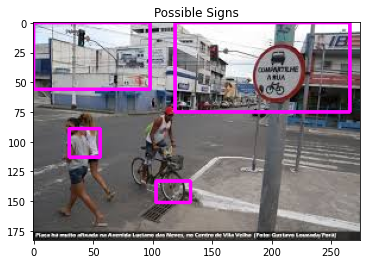

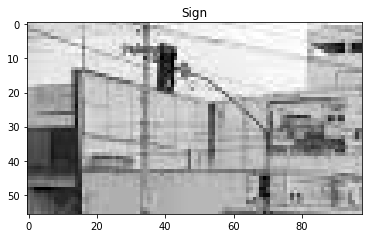

29.jfif


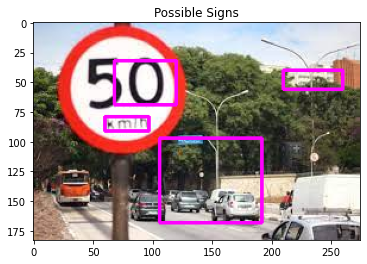

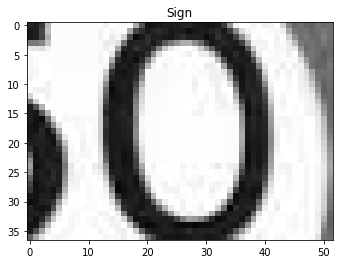

Text: 0
19.jpg


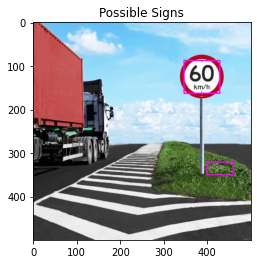

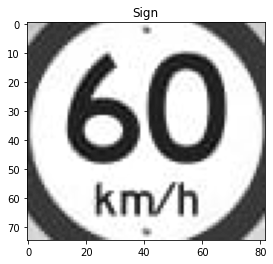

Text: 60
Text: 60kmh
3.png


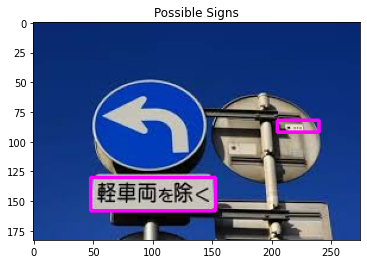

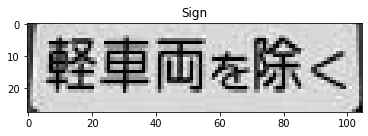

Text: #emeR
14.jfif


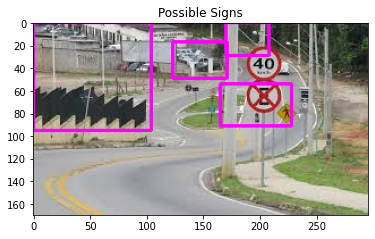

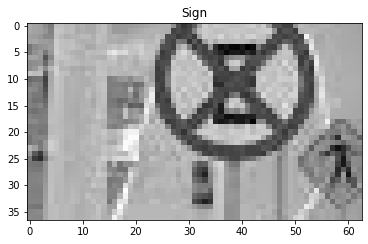

36.jfif


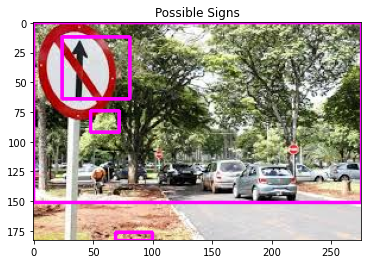

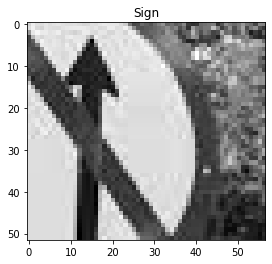

28.jfif


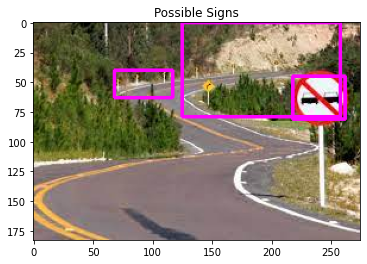

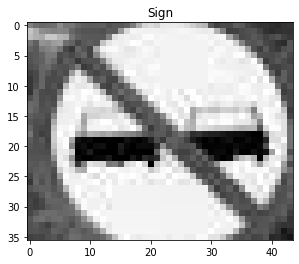

38.jfif


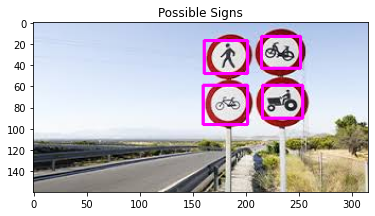

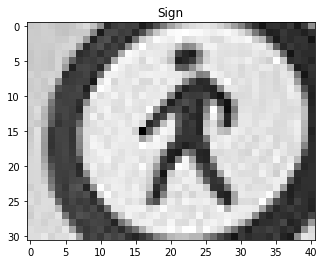

30.jfif


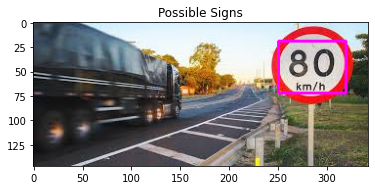

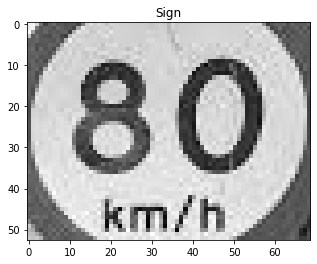

Text: 80
Text: 80km/h
32.jfif


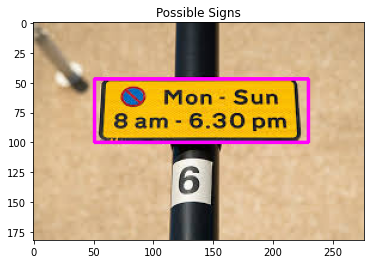

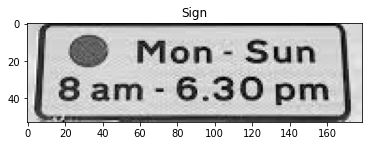

Text: Mon
Text: MonSun
Text: MonSun8 am
Text: MonSun8 am6.30 pm
20.jfif


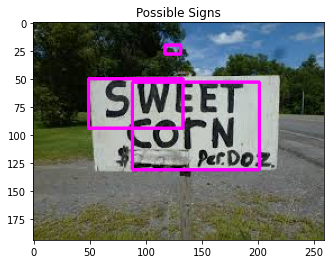

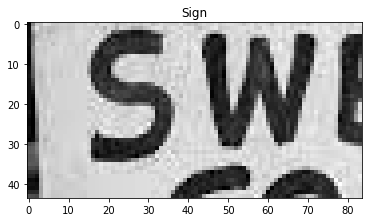

Text: SWE
13.jfif


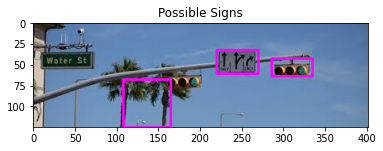

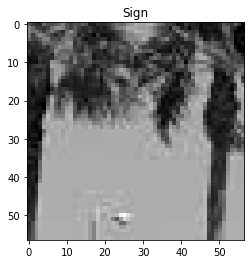

17.jfif


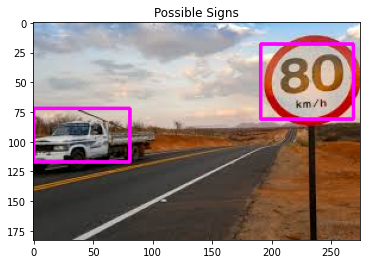

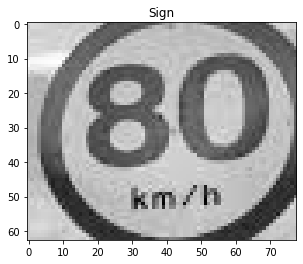

Text: 80
12.jpg


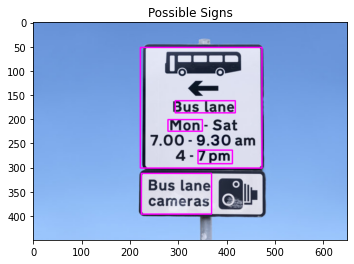

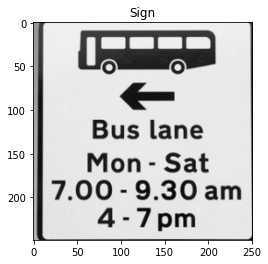

Text: Bus lane
Text: Bus laneMon
Text: Bus laneMonSat
Text: Bus laneMonSat7.00 - 9.30am
Text: Bus laneMonSat7.00 - 9.30am4
Text: Bus laneMonSat7.00 - 9.30am47pm
27.jfif


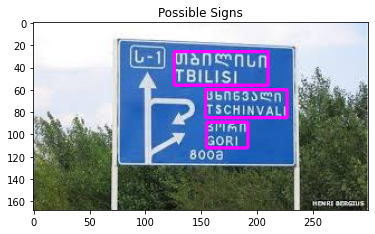

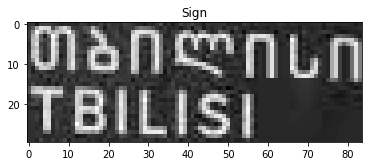

Text: Mlenonun
Text: MlenonunTBILISI
5.png


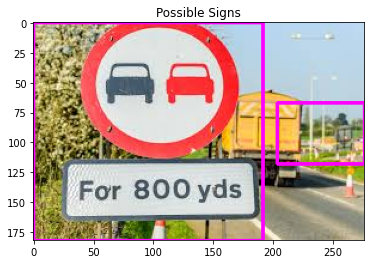

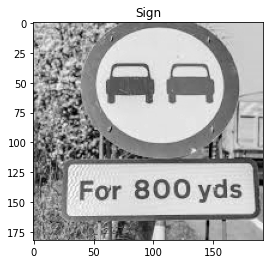

Text: For 800 yds


In [ ]:
for title in files:
  print(title)
  signs = ''

  # Carregando imagens
  imgs = cv2.imread('/content/' + title, 0)
  imgs_orig = cv2.imread('/content/' + title)

  vectors_crops = applyIdealHP(imgs)
  final_imgs = gaussian_met(imgs, imgs_orig, vectors_crops)

  # Printando placas
  if (final_imgs is not None):
    plt.title("Sign")
    plt.imshow(final_imgs, "gray")
    plt.show()

    # Leitura da placa
    results = reader.readtext(final_imgs)
    for i in results:
      signs += (i[1])
      print(f"Text: {signs}")  

## Filtro Butterworth Passa-Altas

33.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: overflow encountered in ubyte_scalars
  if __name__ == '__main__':


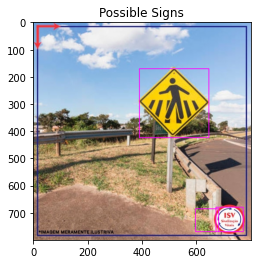

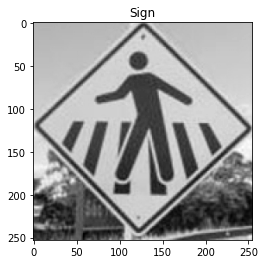

16.jfif


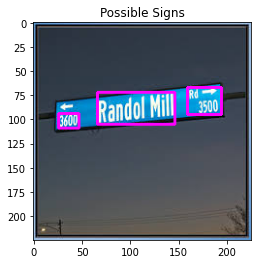

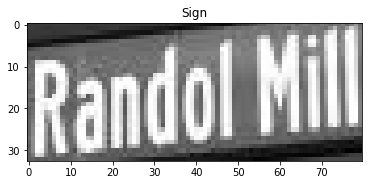

Text: Randol Mill
11.jpg


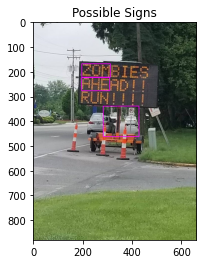

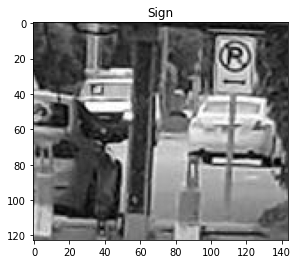

21.jfif


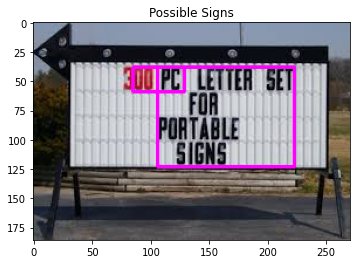

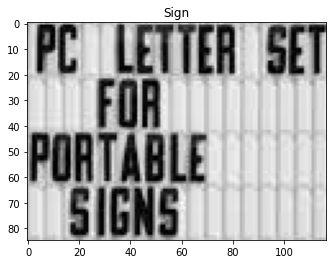

Text: PC | LETTER |SET
Text: PC | LETTER |SETFOR
Text: PC | LETTER |SETFORpoRILEbLE
Text: PC | LETTER |SETFORpoRILEbLESIGN5
18.jfif


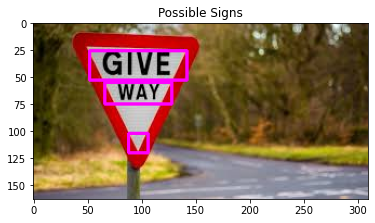

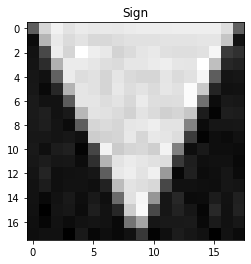

23.jfif


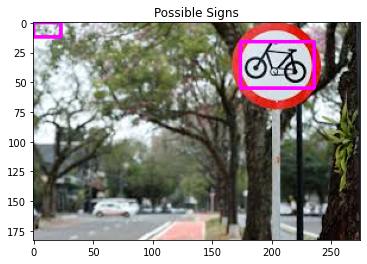

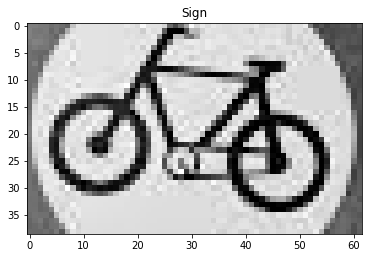

6.png


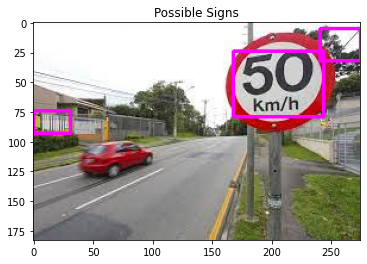

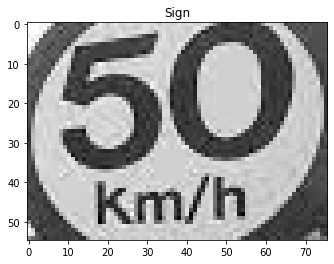

Text: 60
Text: 60Km/h
22.jfif


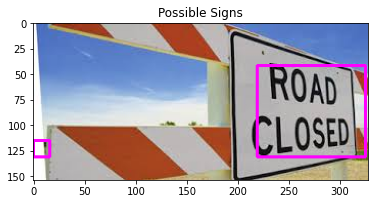

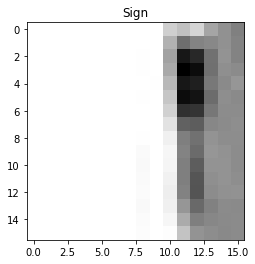

37.jfif


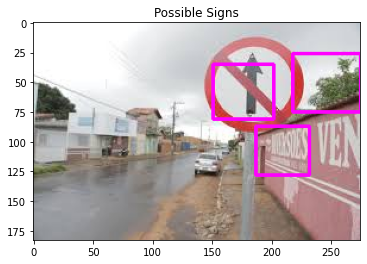

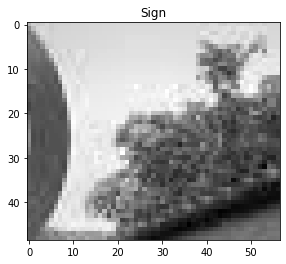

7.jpg


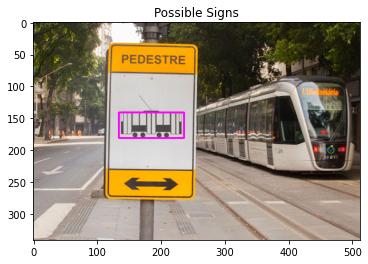

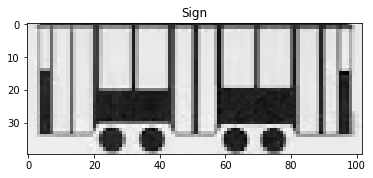

40.jfif


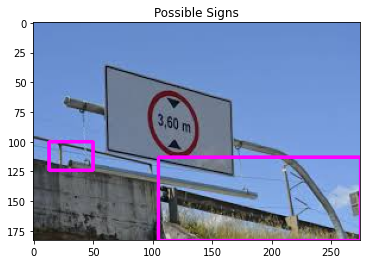

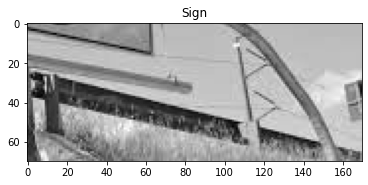

39.jfif


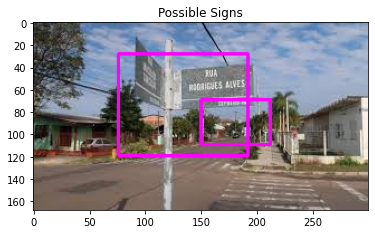

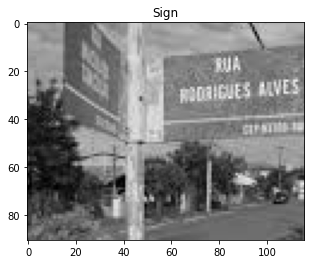

Text: daiges Mves 
35.jfif


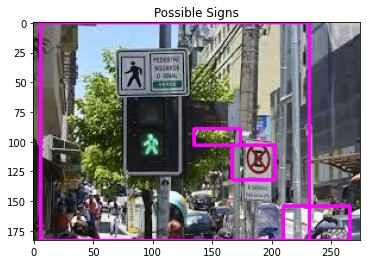

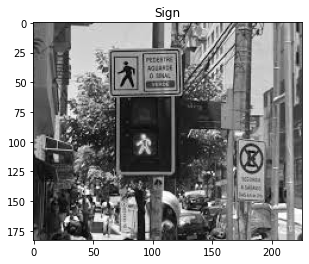

9.jpeg


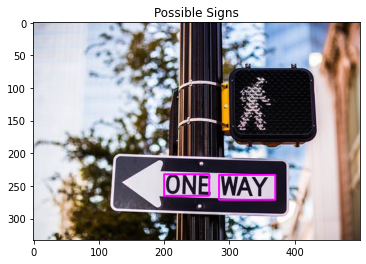

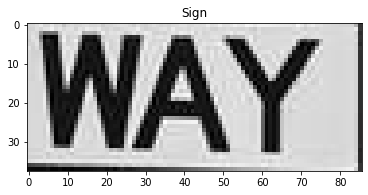

Text: WAY
24.jfif


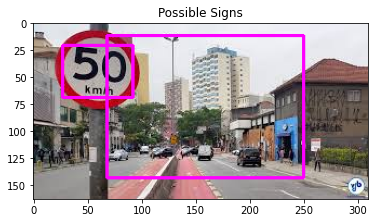

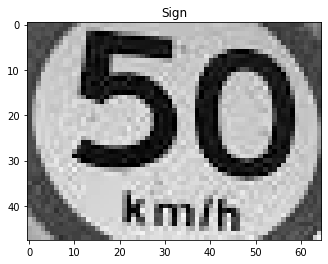

Text: 50
Text: 50kmh
15.jfif


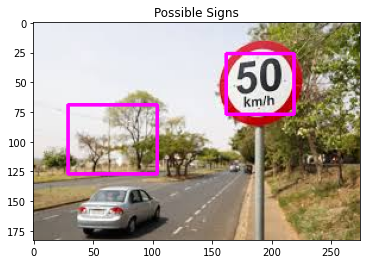

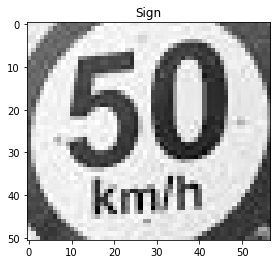

Text: 50
Text: 50kmlh
10.png


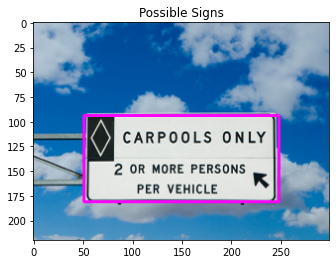

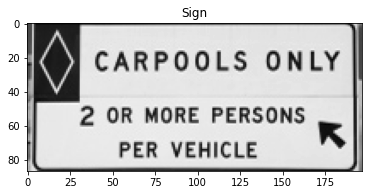

Text: CARPOOLS OnLY
Text: CARPOOLS OnLYOR MORE PERSONS
Text: CARPOOLS OnLYOR MORE PERSONSPER VEHICLE
2.png


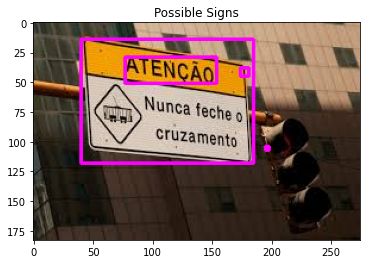

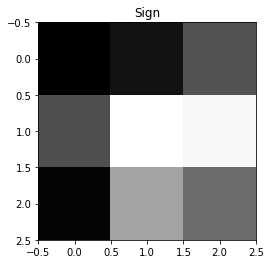

1.png


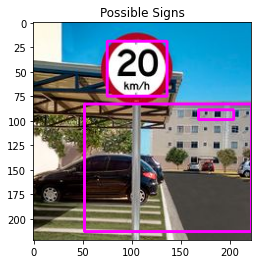

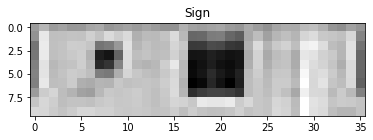

25.jfif


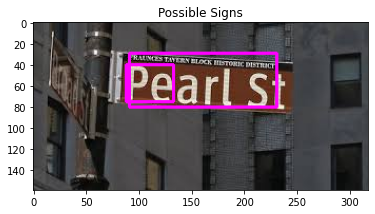

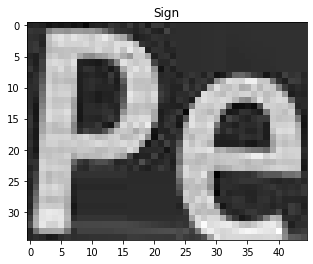

Text: Pe
4.png


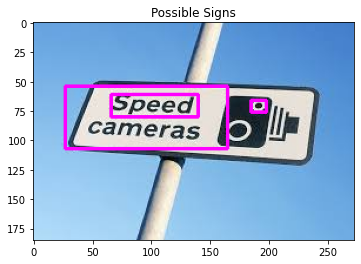

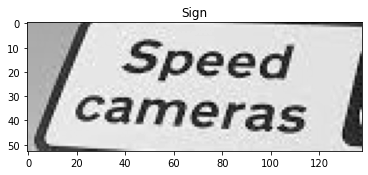

Text: Speed
Text: Speedcameras
26.jfif


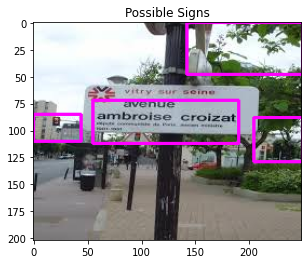

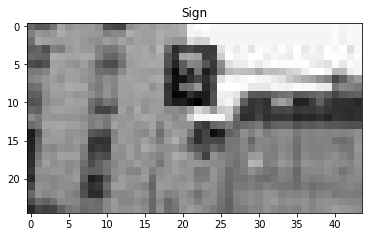

31.jpg


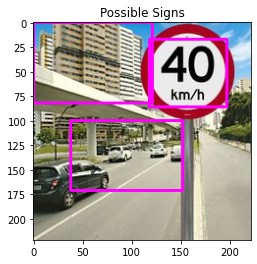

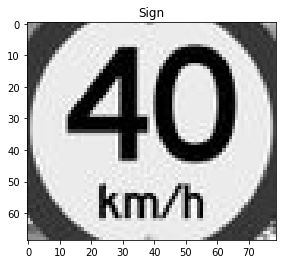

Text: 40
Text: 40km/h
8.jpg


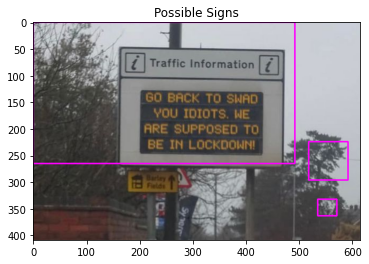

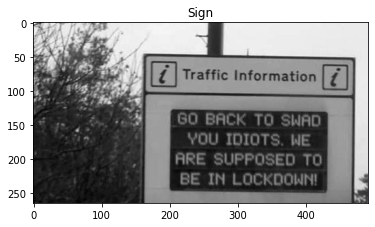

Text: Traffic Information
Text: Traffic InformationG0 BaCKTo Shad
Text: Traffic InformationG0 BaCKTo ShadYOU IDIOTS; NE
Text: Traffic InformationG0 BaCKTo ShadYOU IDIOTS; NEARE SUPPOSED TO
Text: Traffic InformationG0 BaCKTo ShadYOU IDIOTS; NEARE SUPPOSED TOBE IN LOCKDONNI
34.jfif


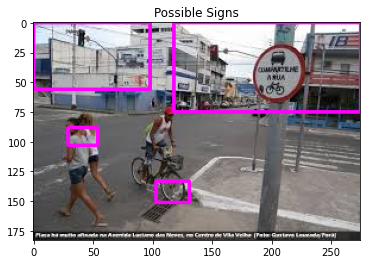

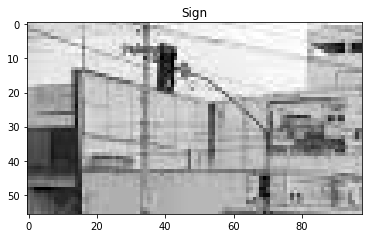

29.jfif


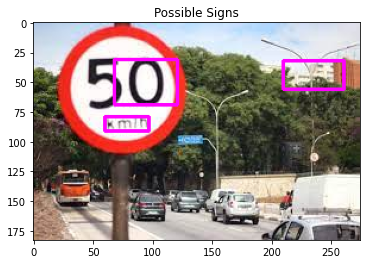

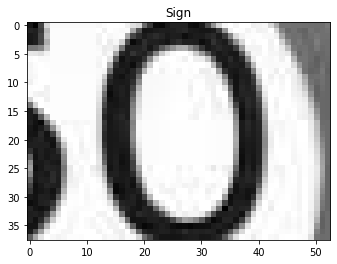

Text: 0
19.jpg


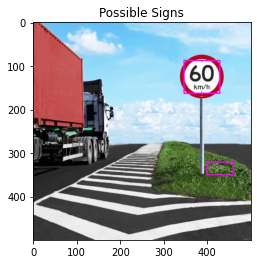

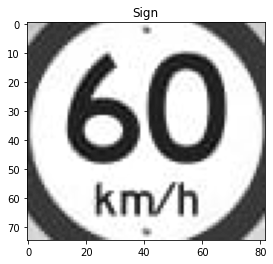

Text: 60
Text: 60kmh
3.png


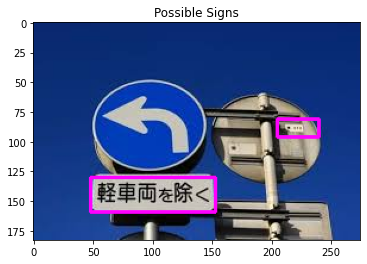

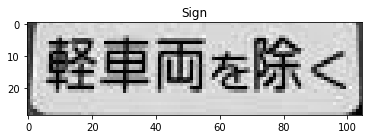

Text: #emeR
14.jfif


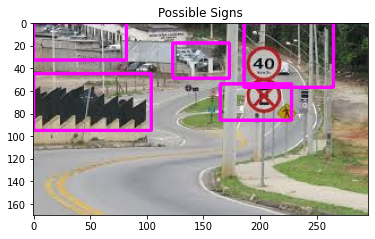

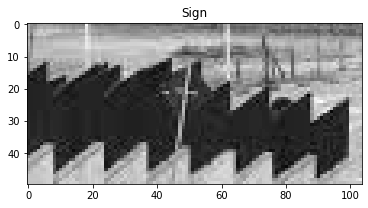

36.jfif


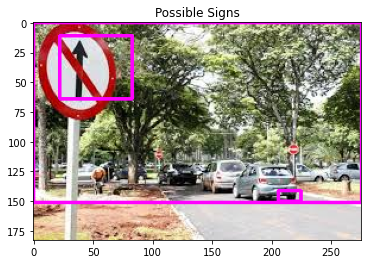

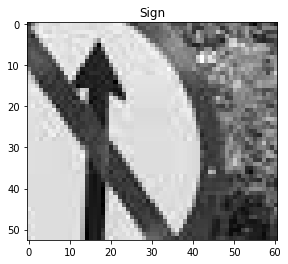

28.jfif


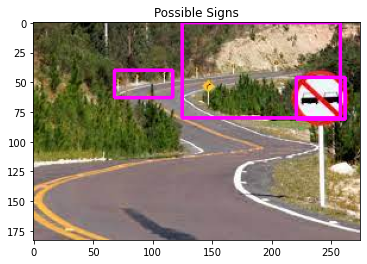

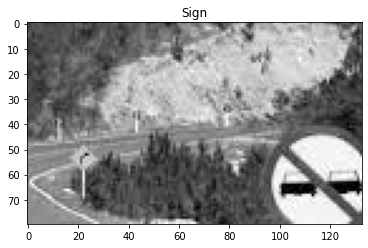

38.jfif


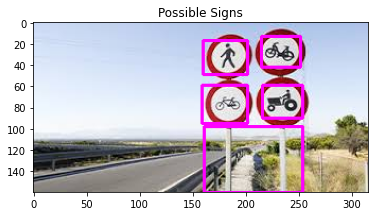

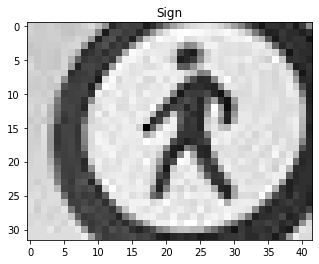

30.jfif


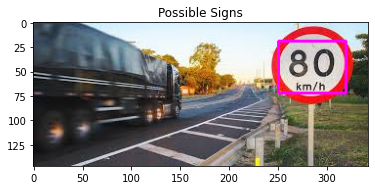

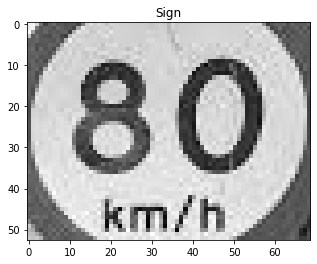

Text: 80
Text: 80km/h
32.jfif


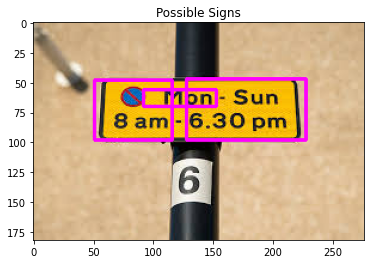

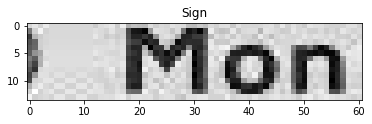

Text: Mon
20.jfif


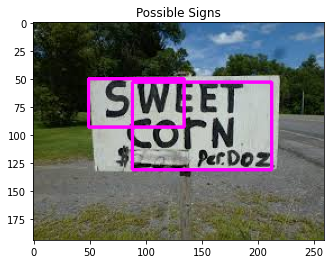

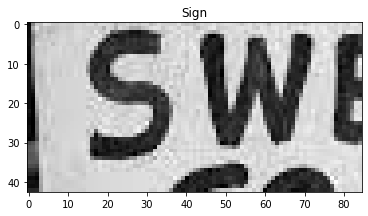

Text: SWE
13.jfif


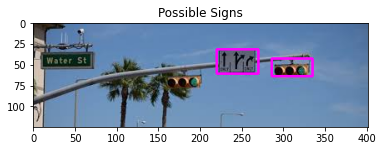

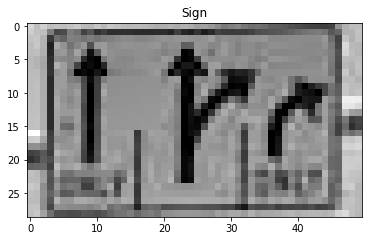

Text: *d
17.jfif


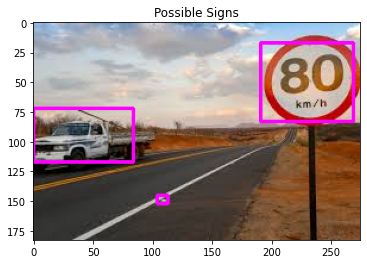

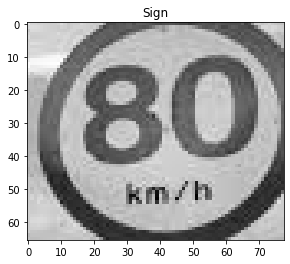

Text: 80
Text: 80rm /n
12.jpg


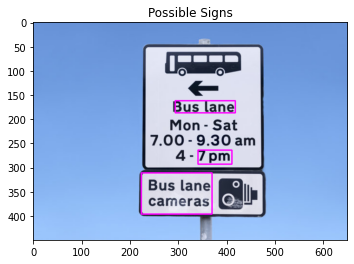

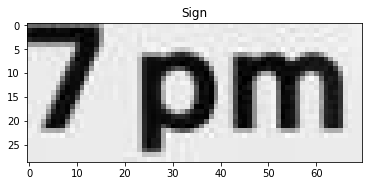

Text: pm
27.jfif


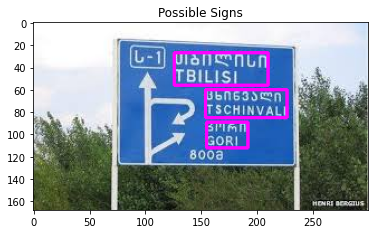

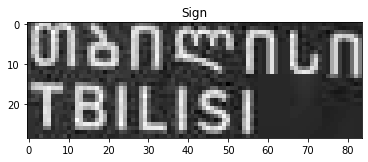

Text: Ulencnun
Text: UlencnunTBILISI
5.png


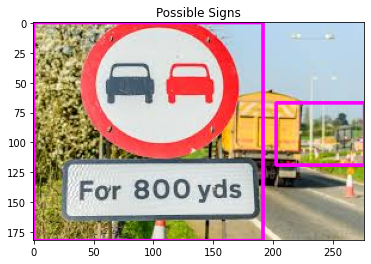

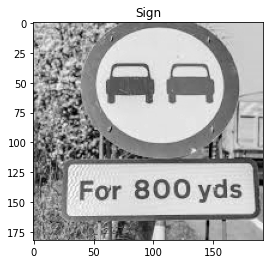

Text: For 800 yds


In [ ]:
for title in files:
  print(title)
  signs = ''

  # Carregando imagens
  imgs = cv2.imread('/content/' + title, 0)
  imgs_orig = cv2.imread('/content/' + title)

  vectors_crops = applyButterworthHP(imgs)
  final_imgs = gaussian_met(imgs, imgs_orig, vectors_crops)

  # Printando placas
  if (final_imgs is not None):
    plt.title("Sign")
    plt.imshow(final_imgs, "gray")
    plt.show()

    # Leitura da placa
    results = reader.readtext(final_imgs)
    for i in results:
      signs += (i[1])
      print(f"Text: {signs}")  